## Predict - Quality level in Water

### Business Case:-
* In this project, we aim to predict the safety level of water by analyzing various chemical and biological parameters present in the dataset.
The features considered include elements and compounds such as aluminium, ammonia, arsenic, barium, cadmium, chloramine, chromium, copper, fluoride,
lead, nitrates, nitrites, mercury, perchlorate, radium, selenium, silver, and uranium. Additionally, the presence of bacteria and viruses is also
taken into account. Based on these factors, the target column is_safe determines whether the water is considered safe for use.

In [1]:
# Importing the required libraries
import numpy as np  # For numerical computations and working with arrays
import pandas as pd  # For data manipulation and analysis
import matplotlib.pyplot as plt  # For creating static visualizations
import seaborn as sns  # For advanced visualizations and styling
import warnings  # For managing warnings in Python
# Ignore all warnings to keep the notebook clean
warnings.filterwarnings("ignore")

In [2]:
# Load the dataset
data = pd.read_csv("waterQuality1.csv")
data

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


### Feature Descriptions for Water Quality Dataset:

Aluminium: A harmful substance that poses health risks when present in water.

Ammonia: Represents the concentration of ammonia, often indicating contamination.

Arsenic: Tracks arsenic levels, which are known to cause serious health complications.

Barium: Elevated levels can negatively impact the heart and kidneys.

Cadmium: Exposure may lead to kidney damage and bone-related problems.

Chloramine: Detects the existence of chloramine in the water.

Chromium: Reflects the amount of chromium, which may be toxic in high concentrations.

Copper: Shows how much copper is present in the water.

Fluoride: Indicates the fluoride content, which affects dental and bone health.

Bacteria: Detects microbial contamination from bacteria.

Viruses: Monitors the presence of viruses in the water.

Lead: High concentrations can result in neurological and developmental disorders.

Nitrates: Measures how much nitrate is dissolved in the water.

Nitrites: Similar to nitrates, nitrites are monitored for their health impact.

Mercury: Displays the level of mercury, which can be toxic even in small amounts.

Perchlorate: Identifies whether perchlorate is present in the sample.

Radium: Indicates the presence of radioactive radium.

Selenium: Tracks how much selenium exists in the water.

Silver: Measures the concentration of silver particles.

Uranium: Detects uranium levels, which can be hazardous.

is_safe: A label indicating whether the water sample is safe for consumption or not.

## Basic checks

In [5]:
data.head() # Displays the first 5 rows

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1


In [6]:
data.tail()  # Displays the last 5 rows

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
7994,0.05,7.78,0.00,1.95,0.04,0.10,0.03,0.03,1.37,0.0,...,0.197,14.29,1.0,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.01,0.45,0.02,0.02,1.48,0.0,...,0.031,10.27,1.0,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.03,0.05,0.05,0.02,0.91,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.00,2.00,0.00,0.09,0.00,0.0,...,0.000,0.00,0.0,0.000,0.00,0.00,0.00,0.00,0.00,1
7998,0.04,6.85,0.01,0.70,0.03,0.05,0.01,0.03,1.00,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1


In [7]:
data.describe() # Describe statistical summary

,aluminium,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
count,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000
mean,0.666158,0.161445,1.567715,0.042806,2.176831,0.247226,0.805857,0.771565,0.319665,0.328583,0.099450,9.818822,1.329961,0.005194,16.460299,2.920548,0.049685,0.147781,0.044673
std,1.265145,0.252590,1.216091,0.036049,2.567027,0.270640,0.653539,0.435373,0.329485,0.378096,0.058172,5.541331,0.573219,0.002967,17.687474,2.323009,0.028770,0.143551,0.026904
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.405000,0.000000,0.002000,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000
50%,0.070000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,0.102000,9.930000,1.420000,0.005000,7.740000,2.410000,0.050000,0.080000,0.050000
75%,0.280000,0.100000,2.480000,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,0.151000,14.610000,1.760000,0.008000,29.480000,4.670000,0.070000,0.240000,0.070000
max,5.050000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000


In [8]:
data.describe(include="O")  # To get a summary of object (categorical) column

,ammonia,is_safe
count,7999,7999
unique,2564,3
top,0.17,0
freq,13,7084


In [9]:
data.info() # Displays non-null values and the data types of each columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

## EDA

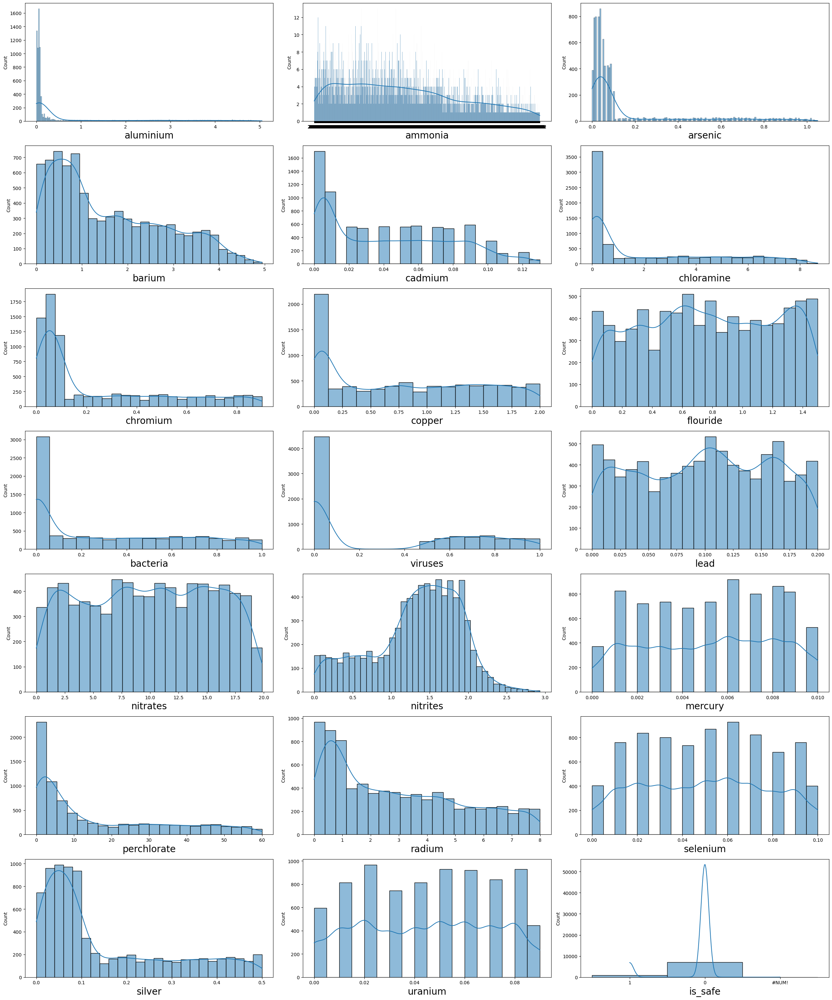

In [11]:
plt.figure(figsize=(25,30))
plt_num = 1
for column in data:
    if plt_num <= 21:
        plt.subplot(7,3,plt_num)
        sns.histplot(data[column],kde=True)
        plt.xlabel(column,fontsize = 20)
    plt_num += 1
plt.tight_layout()

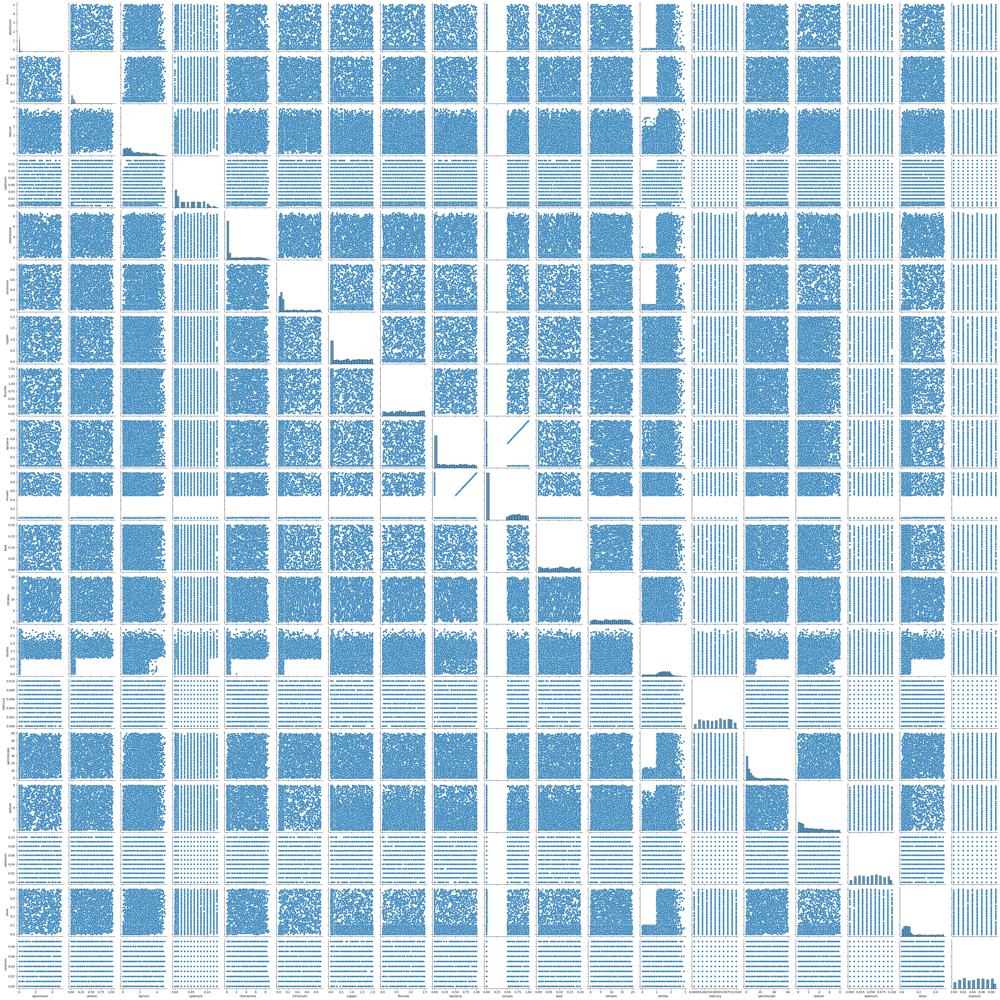

In [12]:
# pairwise scatter plots for all numerical columns 
sns.pairplot(data)

## Data Preprocessing

In [14]:
data.isnull().sum() # Finding missing values

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64

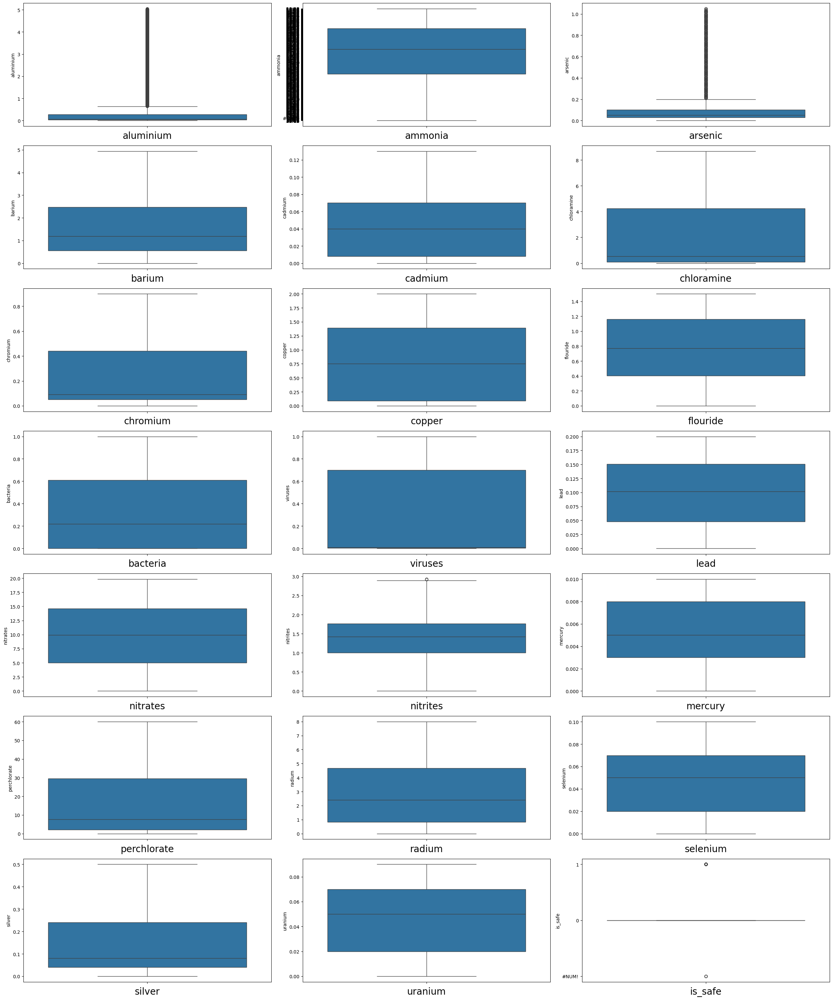

In [15]:
plt.figure(figsize=(25,30))  # Set overall figure size
plt_num = 1  # Start plot number
for column in data:
    if plt_num <= 21:  # Limit to first 21 columns
        plt.subplot(7, 3, plt_num)  # Create subplot (7 rows, 3 columns)
        sns.boxplot(data[column])  # Plot boxplot
        plt.xlabel(column, fontsize=20)  # Set x-axis label
    plt_num += 1  # Next plot
plt.tight_layout()  # Adjust layout to avoid overlap

<Axes: xlabel='aluminium'>

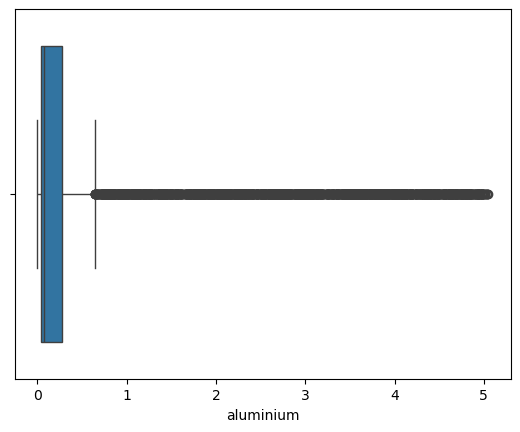

In [16]:
sns.boxplot(x = data.aluminium) # Draw boxplot to visualize outliers in 'aluminium'

<Axes: xlabel='arsenic'>

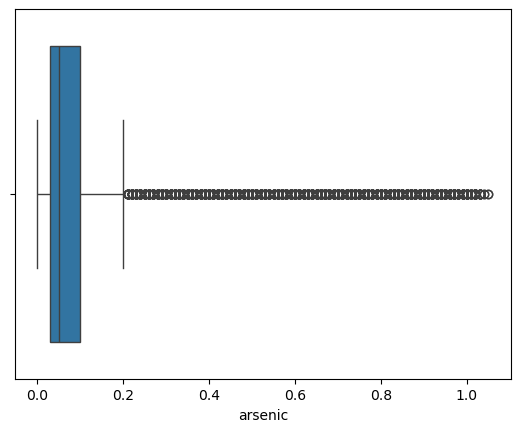

In [17]:
sns.boxplot(x = data.arsenic) # Draw boxplot to visualize outliers in 'arsenic'

<Axes: xlabel='nitrites'>

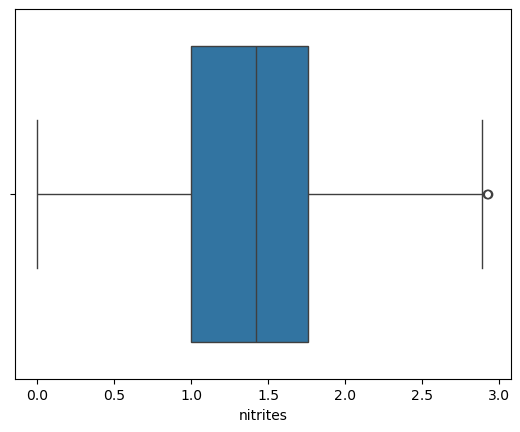

In [18]:
sns.boxplot(x = data.nitrites) # Draw boxplot to visualize outliers in 'nitrites'

In [35]:
data["nitrites"].median() # Calculate median of 'nitrites' column

1.42

In [37]:
data.loc[data["nitrites"] >=2.7,"nitrites"] = 1.42  # Replace high nitrites values with its median

<Axes: xlabel='nitrites'>

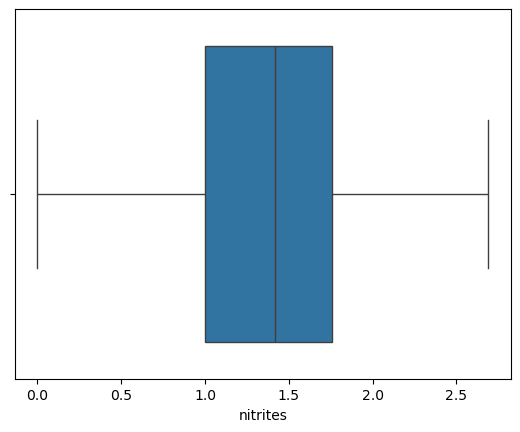

In [39]:
sns.boxplot(x = data.nitrites) # Draw boxplot to visualize outliers in 'nitrites' after outliers 

In [41]:
data # show dataset

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


In [43]:
data.loc[data["ammonia"] == '#NUM!',"ammonia"] # Find rows where 'ammonia' has '#NUM!' error values

7551    #NUM!
7568    #NUM!
7890    #NUM!
Name: ammonia, dtype: object

In [45]:
data.loc[data["ammonia"] == '#NUM!',"ammonia"] = 14.13 # Find rows where 'ammonia' has '#NUM!' error values

In [47]:
data["ammonia"] = data["ammonia"].astype("float64") # Convert 'ammonia' column to float type

In [49]:
data.ammonia.median() # Find median of 'ammonia' column

14.13

In [51]:
data.is_safe.value_counts() # Count how many safe (1) and unsafe (0) samples are in 'is_safe' column

is_safe
0        7084
1         912
#NUM!       3
Name: count, dtype: int64

In [53]:
data.loc[data["is_safe"] == '#NUM!',"is_safe"] = 1 # Replace invalid '#NUM!' entries in 'is_safe' column with 1 (safe)

In [55]:
data["is_safe"] = data["is_safe"].astype("int") # Convert 'is_safe' column to integer type

In [57]:
data.info() # Displays non-null values and the data types of each columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   float64
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

## Feature Selection

<Axes: >

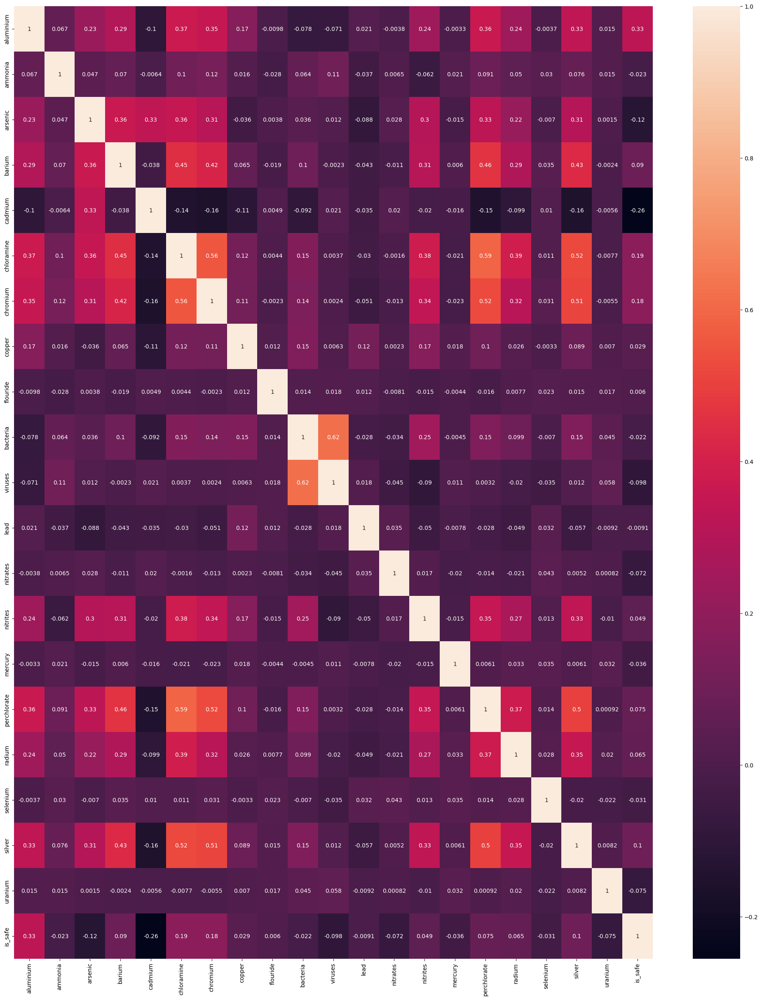

In [60]:
plt.figure(figsize=(25,30))  # Set figure size for better visibility
sns.heatmap(data.corr(), annot=True)  # Plot heatmap with correlation values between features


In [61]:
data.corr() # Calculates pairwise correlation between numerical columns in the DataFrame

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
aluminium,1.000000,0.067369,0.225773,0.294145,-0.099911,0.369309,0.353218,0.168612,-0.009784,-0.078238,...,0.020792,-0.003810,0.239033,-0.003306,0.363069,0.243217,-0.003672,0.334993,0.014711,0.332950
ammonia,0.067369,1.000000,0.046784,0.070097,-0.006422,0.104768,0.124774,0.015954,-0.028216,0.063596,...,-0.037061,0.006484,-0.062055,0.020875,0.090922,0.050384,0.029894,0.075545,0.014632,-0.022903
arsenic,0.225773,0.046784,1.000000,0.362945,0.334682,0.356559,0.312475,-0.036444,0.003792,0.035688,...,-0.087756,0.027554,0.304569,-0.015404,0.332279,0.218204,-0.007009,0.307837,0.001455,-0.123530
barium,0.294145,0.070097,0.362945,1.000000,-0.037803,0.446928,0.415972,0.065426,-0.018548,0.101259,...,-0.042888,-0.011331,0.312134,0.005987,0.462234,0.286569,0.035242,0.431606,-0.002440,0.090232
cadmium,-0.099911,-0.006422,0.334682,-0.037803,1.000000,-0.144370,-0.157766,-0.109024,0.004880,-0.092431,...,-0.034959,0.020194,-0.020278,-0.016174,-0.149344,-0.099259,0.010145,-0.155408,-0.005633,-0.255405
chloramine,0.369309,0.104768,0.356559,0.446928,-0.144370,1.000000,0.555938,0.119059,0.004400,0.154510,...,-0.030479,-0.001551,0.379115,-0.021472,0.588769,0.388806,0.011399,0.522447,-0.007658,0.185590
chromium,0.353218,0.124774,0.312475,0.415972,-0.157766,0.555938,1.000000,0.113043,-0.002284,0.142041,...,-0.050501,-0.012793,0.338331,-0.022787,0.524532,0.315271,0.030539,0.510768,-0.005526,0.181262
copper,0.168612,0.015954,-0.036444,0.065426,-0.109024,0.119059,0.113043,1.000000,0.011683,0.149110,...,0.121765,0.002332,0.166673,0.017626,0.104564,0.026215,-0.003267,0.089333,0.006978,0.029097
flouride,-0.009784,-0.028216,0.003792,-0.018548,0.004880,0.004400,-0.002284,0.011683,1.000000,0.014134,...,0.011905,-0.008140,-0.015463,-0.004400,-0.016191,0.007688,0.022629,0.014554,0.016792,0.006025
bacteria,-0.078238,0.063596,0.035688,0.101259,-0.092431,0.154510,0.142041,0.149110,0.014134,1.000000,...,-0.027525,-0.033920,0.248685,-0.004471,0.147652,0.099298,-0.006971,0.148225,0.044839,-0.022453


In [62]:
for column in data:  # Loops all column names in the DataFrame
    print(column) # Prints each column name

aluminium
ammonia
arsenic
barium
cadmium
chloramine
chromium
copper
flouride
bacteria
viruses
lead
nitrates
nitrites
mercury
perchlorate
radium
selenium
silver
uranium
is_safe


In [63]:
# List of numeric columns to select from the dataset
num_columns = (["aluminium", "ammonia", "arsenic", "barium", "cadmium", "chloramine",
                "chromium", "copper", "flouride", "bacteria", "viruses", "lead",
                "nitrates", "nitrites", "mercury", "perchlorate", "radium",
                "selenium", "silver", "uranium"])

# Selecting only the specified numeric columns from the DataFrame
num_columns = data[num_columns]

In [64]:
from sklearn.preprocessing import MinMaxScaler
ME = MinMaxScaler()  # Create MinMaxScaler object
df = ME.fit_transform(num_columns)  # Apply scaling to numeric columns
df  # Display the scaled data

array([[0.32673267, 0.30614973, 0.03809524, ..., 0.8       , 0.68      ,
        0.22222222],
       [0.45940594, 0.70989305, 0.00952381, ..., 0.8       , 0.54      ,
        0.55555556],
       [0.2       , 0.47125668, 0.03809524, ..., 0.7       , 0.88      ,
        0.11111111],
       ...,
       [0.01782178, 0.23161765, 0.        , ..., 0.        , 0.08      ,
        0.55555556],
       [0.0019802 , 0.3368984 , 0.00952381, ..., 0.        , 0.        ,
        0.        ],
       [0.00792079, 0.23161765, 0.00952381, ..., 0.        , 0.08      ,
        0.55555556]])

In [65]:
x = pd.DataFrame(
    data=df,  # Use scaled data
    columns=[  # Assign original column names
        "aluminium", "ammonia", "arsenic", "barium", "cadmium", "chloramine",
        "chromium", "copper", "flouride", "bacteria", "viruses", "lead",
        "nitrates", "nitrites", "mercury", "perchlorate", "radium",
        "selenium", "silver", "uranium"
    ]
)

In [66]:
x  # Display the DataFrame with scaled numeric columns

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
0,0.326733,0.306150,0.038095,0.576923,0.053846,0.040323,0.922222,0.085,0.033333,0.20,0.000,0.270,0.810893,0.420074,0.7,0.629062,0.848561,0.8,0.68,0.222222
1,0.459406,0.709893,0.009524,0.670040,0.015385,0.608295,0.755556,0.330,0.600000,0.65,0.650,0.500,0.101362,0.717472,0.3,0.537577,0.401752,0.8,0.54,0.555556
2,0.200000,0.471257,0.038095,0.117409,0.061538,0.488479,0.588889,0.010,0.660000,0.05,0.003,0.390,0.714070,0.412639,0.6,0.837860,0.884856,0.7,0.88,0.111111
3,0.269307,0.381350,0.038095,0.599190,0.007692,0.832949,0.033333,0.830,0.720000,0.71,0.710,0.080,0.071104,0.479554,0.4,0.151975,0.215269,0.2,0.90,0.555556
4,0.182178,0.815842,0.028571,0.040486,0.046154,0.307604,0.766667,0.285,0.406667,0.13,0.001,0.585,0.339889,0.412639,0.3,0.281620,0.301627,0.2,0.12,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.009901,0.262701,0.000000,0.394737,0.307692,0.011521,0.033333,0.015,0.913333,0.00,0.000,0.985,0.720625,0.371747,0.5,0.059490,0.266583,0.9,0.12,0.333333
7995,0.009901,0.812166,0.019048,0.119433,0.076923,0.051843,0.022222,0.010,0.986667,0.00,0.000,0.155,0.517902,0.371747,0.1,0.024663,0.138924,0.9,0.20,0.888889
7996,0.017822,0.231618,0.000000,0.123482,0.230769,0.005760,0.055556,0.010,0.606667,0.00,0.000,0.910,0.802824,0.371747,0.0,0.022496,0.605757,0.0,0.08,0.555556
7997,0.001980,0.336898,0.009524,0.404858,0.000000,0.230415,0.000000,0.045,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.000000


In [67]:
y = data.is_safe  # Select target variable 'is_safe' from the dataset
y  # Display the target variable

0       1
1       1
2       0
3       1
4       1
       ..
7994    1
7995    1
7996    1
7997    1
7998    1
Name: is_safe, Length: 7999, dtype: int32

In [68]:
from sklearn.model_selection import train_test_split

# Split data into training and testing sets (25% test size)
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.25, random_state=40)

In [69]:
x_train # Show training features after the split

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
2761,0.001980,0.744652,0.000952,0.455466,0.023077,0.546083,0.166667,0.665,0.420000,0.74,0.740,0.660,0.556732,0.687732,0.9,0.515081,0.836045,1.0,0.22,0.555556
4141,0.011881,0.123663,0.009524,0.036437,0.692308,0.002304,0.055556,0.025,0.046667,0.00,0.790,0.820,0.032779,0.245353,1.0,0.121480,0.097622,0.6,0.06,0.444444
2994,0.003960,0.518717,0.038095,0.334008,0.007692,0.764977,0.788889,0.735,0.100000,0.37,0.002,0.425,0.955623,0.713755,0.1,0.551075,0.444305,0.5,0.36,0.777778
4782,0.009901,0.643048,0.085714,0.050607,0.076923,0.061060,0.066667,0.040,0.606667,0.00,0.008,0.095,0.205245,0.115242,0.8,0.008999,0.011264,0.3,0.10,0.444444
740,0.306931,0.380348,0.019048,0.635628,0.053846,0.866359,0.033333,0.050,0.920000,0.00,0.000,0.165,0.374685,0.576208,0.7,0.329445,0.302879,0.9,0.52,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064,0.007921,0.703877,0.419048,0.854251,0.692308,0.430876,0.022222,0.095,0.346667,0.74,0.740,0.310,0.363591,0.784387,0.4,0.497584,0.832290,0.0,0.84,0.222222
6309,0.011881,0.803142,0.047619,0.261134,0.000000,0.019585,0.100000,0.460,0.726667,0.75,0.750,0.425,0.304085,0.494424,0.9,0.029995,0.110138,0.5,0.00,0.111111
6151,0.005941,0.844586,0.047619,0.151822,0.230769,0.018433,0.033333,0.390,0.060000,0.83,0.830,0.690,0.528996,0.546468,0.9,0.155474,0.414268,0.9,0.08,0.555556
6363,0.017822,0.419118,0.047619,0.340081,0.230769,0.001152,0.011111,0.985,0.906667,0.37,0.001,0.300,0.730711,0.472119,0.4,0.111815,0.070088,0.3,0.18,0.555556


In [80]:
x_test # Show test features after the split

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
5324,0.007921,0.630013,0.066667,0.103239,0.307692,0.061060,0.033333,0.920,0.500000,0.00,0.920,0.710,0.403429,0.338290,0.4,0.022996,0.098874,0.2,0.20,1.000000
7391,0.015842,0.488302,0.085714,0.135628,0.153846,0.044931,0.088889,0.155,0.493333,0.55,0.550,0.465,0.443772,0.750929,0.9,0.128479,0.785982,0.9,0.02,0.555556
6145,0.011881,0.978275,0.009524,0.030364,0.461538,0.010369,0.011111,0.755,0.240000,0.78,0.780,0.795,0.679778,0.591078,0.8,0.098317,0.257822,0.7,0.16,0.777778
2242,0.007921,0.398396,0.047619,0.554656,0.061538,0.703917,0.155556,0.995,0.960000,0.15,0.003,0.500,0.193646,0.620818,1.0,0.515081,0.265332,0.2,0.98,0.444444
4100,0.019802,0.970254,0.047619,0.354251,0.538462,0.010369,0.077778,0.035,0.946667,0.00,1.000,0.410,0.569844,0.263941,0.6,0.047492,0.082603,0.0,0.06,0.555556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5831,0.007921,0.964906,0.028571,0.135628,0.153846,0.006912,0.088889,0.450,0.186667,0.19,0.001,0.295,0.526475,0.018587,0.6,0.014498,0.112641,0.6,0.12,0.888889
4396,0.015842,0.253676,0.028571,0.178138,0.461538,0.004608,0.033333,0.045,0.866667,0.03,0.007,0.550,0.054463,0.208178,0.8,0.141476,0.031289,0.7,0.20,0.444444
1715,0.041584,0.513035,0.971429,0.736842,0.461538,0.282258,0.055556,0.950,0.733333,1.00,1.000,0.825,0.427131,0.631970,0.3,0.475087,0.429287,0.9,0.20,0.000000
1094,0.556436,0.138035,0.904762,0.585020,0.923077,0.542627,0.211111,0.615,0.573333,0.00,0.000,0.095,0.860817,0.579926,0.7,0.197467,0.202753,0.1,0.42,0.888889


In [82]:
# Import SMOTE for balancing classes by oversampling minority class
from imblearn.over_sampling import SMOTE

In [83]:
smote = SMOTE() # Initialize SMOTE to handle class imbalance
x_train_smote, y_train_smote = smote.fit_resample(x_train, y_train) # Apply SMOTE on training data

In [84]:
from collections import Counter
print("Before data", Counter(y_train))  # Count original class distribution
print("After Over Sampling", Counter(y_train_smote))  # Count class distribution after SMOTE

Before data Counter({0: 5307, 1: 692})
After Over Sampling Counter({0: 5307, 1: 5307})


## Logistic Regression

In [86]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()  # Create logistic regression model
lr.fit(x_train_smote, y_train_smote)  # Train model on balanced training data

LogisticRegression()

In [87]:
y_pred1 = lr.predict(x_test) # Predict on test set
y_train_pred1 = lr.predict(x_train) # Predict on original training set

In [88]:
# Import evaluation metrics for model performance
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,classification_report

In [89]:
y_pred1 # Display predictions made by the model on test data

array([0, 0, 0, ..., 0, 0, 0])

In [90]:
a1 = accuracy_score(y_test, y_pred1)  # Calculate accuracy on test data
a1  # Show accuracy score

0.807

In [99]:

f1 = f1_score(y_test, y_pred1, average="weighted")  # Calculate weighted F1 score on test data
f1  # Show F1 score

0.8362583254743798

In [101]:
print(classification_report(y_test,y_pred1)) # Show detailed classification metrics

              precision    recall  f1-score   support

           0       0.97      0.81      0.88      1777
           1       0.34      0.78      0.47       223

    accuracy                           0.81      2000
   macro avg       0.65      0.79      0.68      2000
weighted avg       0.90      0.81      0.84      2000



## SVM

In [104]:
from sklearn.svm import SVC 
svc = SVC()  # Create SVM model
svc.fit(x_train_smote, y_train_smote)  # Train SVM with balanced training data

SVC()

In [105]:
y_pred2 = svc.predict(x_test) # Predict test data with SVM
y_train_pred2 = svc.predict(x_train) # Predict train data with SVM

In [106]:
a2 = accuracy_score(y_test, y_pred2)  # Calculate accuracy for SVM model on test data
a2  # Display accuracy score

0.9155

In [107]:
f2 = f1_score(y_test, y_pred2, average="weighted")  # Calculate weighted F1 score for SVM model on test data
f2  # Display F1 score

0.9206712316674933

In [112]:
print(classification_report(y_test,y_pred2)) # Show precision, recall, f1-score, support for SVM predictions

              precision    recall  f1-score   support

           0       0.97      0.93      0.95      1777
           1       0.59      0.79      0.68       223

    accuracy                           0.92      2000
   macro avg       0.78      0.86      0.81      2000
weighted avg       0.93      0.92      0.92      2000



## Decision Tree

In [115]:
from sklearn.tree import DecisionTreeClassifier 
dt = DecisionTreeClassifier()  # Initialize decision tree classifier
dt.fit(x_train_smote, y_train_smote)  # Train on balanced training data

DecisionTreeClassifier()

In [116]:
y_pred3 = dt.predict(x_test) # Predict test set labels
y_train_pred3 = dt.predict(x_train) # Predict train set labels

In [119]:
a3 = accuracy_score(y_test, y_pred3)  # Calculate accuracy on test set
a3  # Display accuracy score

0.9475

In [121]:
f3 = f1_score(y_test, y_pred3, average="weighted")  # Calculate weighted F1 score on test set
f3  # Display F1 score

0.9490624312579636

In [123]:
print(classification_report(y_test,y_pred3)) # Show precision, recall, f1-score, support for SVM predictions

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1777
           1       0.73      0.84      0.78       223

    accuracy                           0.95      2000
   macro avg       0.85      0.90      0.88      2000
weighted avg       0.95      0.95      0.95      2000



## Bagging

In [126]:
from sklearn.ensemble import BaggingClassifier
model_dt = DecisionTreeClassifier  # Assign DecisionTreeClassifier class (should be instantiated)
bg = BaggingClassifier()  # Create BaggingClassifier with default base estimator (DecisionTreeClassifier)
bg.fit(x_train_smote, y_train_smote)  # Train bagging model on balanced training data

BaggingClassifier()

In [127]:
y_pred4 = bg.predict(x_test) # Predict on test data using bagging model
y_train_pred4 = bg.predict(x_train) # Predict on training data using bagging model

In [128]:
a4 = accuracy_score(y_test, y_pred4)  # Calculate accuracy on test data
a4  # Show test accuracy

0.959

In [129]:
f4 = f1_score(y_test, y_pred4, average="weighted")  # Calculate weighted F1 score on test data
f4  # Show F1 score

0.9593917171597164

In [134]:
print(classification_report(y_test,y_pred4)) # Show precision, recall, f1-score, support for SVM predictions

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1777
           1       0.80      0.84      0.82       223

    accuracy                           0.96      2000
   macro avg       0.89      0.91      0.90      2000
weighted avg       0.96      0.96      0.96      2000



## Random Forest

In [137]:
from sklearn.ensemble import RandomForestClassifier  # Import Random Forest classifier
rm = RandomForestClassifier()  # Create model object
rm.fit(x_train_smote, y_train_smote)  # Train model on oversampled training data

RandomForestClassifier()

In [138]:
y_pred5 = rm.predict(x_test)  # Predict on test data
y_train_pred5 = rm.predict(x_train)  # Predict on training data

In [139]:
a5 = accuracy_score(y_test, y_pred5)  # Calculate accuracy of Random Forest on test data
a5  # Show accuracy

0.954

In [140]:
f5 = f1_score(y_test, y_pred5, average="weighted")  # Calculate weighted F1-score for Random Forest
f5  # Show F1-score

0.9542664145823148

In [145]:
print(classification_report(y_test,y_pred5)) # Show precision, recall, f1-score, support for SVM predictions

              precision    recall  f1-score   support

           0       0.98      0.97      0.97      1777
           1       0.79      0.81      0.80       223

    accuracy                           0.95      2000
   macro avg       0.88      0.89      0.89      2000
weighted avg       0.95      0.95      0.95      2000



## KNN

In [148]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()  # Create an instance of K-Nearest Neighbors classifier
knn.fit(x_train_smote, y_train_smote)  # Train the KNN model on the oversampled training data

KNeighborsClassifier()

In [150]:
y_pred6=knn.predict(x_test) # Predict on test data
y_train_pred6=knn.predict(x_train) # Predict on training data

In [151]:
a6 = accuracy_score(y_test,y_pred6) # Calculate accuracy of KNN on test data
a6 # show accuracy

0.782

In [152]:
f6 = f1_score(y_test,y_pred6,average="weighted")  # Calculate weighted F1-score for KNN
f6 # show f1score

0.8177822942545052

In [156]:
print(classification_report(y_test,y_pred6))  # Show precision, recall, f1-score, support for KNN predictions

              precision    recall  f1-score   support

           0       0.97      0.78      0.86      1777
           1       0.31      0.79      0.45       223

    accuracy                           0.78      2000
   macro avg       0.64      0.79      0.66      2000
weighted avg       0.89      0.78      0.82      2000



## Gradient Boosting

In [159]:
from sklearn.ensemble import GradientBoostingClassifier  # Import GBC algorithm
gb = GradientBoostingClassifier()  # Create GBC model
gb.fit(x_train_smote, y_train_smote)  # Train model on oversampled training data

GradientBoostingClassifier()

In [160]:
y_pred7=gb.predict(x_test) # Predict on test data
y_train_pred7=gb.predict(x_train) # Predict on training data

In [161]:
a7 = accuracy_score(y_test,y_pred7) # Calculate accuracy of Gradient Boosting on test data
a7 # show accuracy

0.938

In [162]:
f7 = f1_score(y_test,y_pred7,average="weighted")  # Calculate weighted F1-score for Gradient Boosting
f7 # show f1score

0.9409618837400541

In [163]:
print(classification_report(y_test,y_pred7))  # Show precision, recall, f1-score, support for Gradient Boosting predictions

              precision    recall  f1-score   support

           0       0.98      0.95      0.96      1777
           1       0.68      0.85      0.75       223

    accuracy                           0.94      2000
   macro avg       0.83      0.90      0.86      2000
weighted avg       0.95      0.94      0.94      2000



## XGBoost

In [170]:
from xgboost import XGBClassifier
xgb = XGBClassifier(n_estimators=651, max_depth=23, learning_rate=0.2) # Create XGBoost classifier with specific hyperparameters
xgb.fit(x_train_smote, y_train_smote) # Train the XGBoost model on oversampled training data

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=23, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=651, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [171]:
y_pred8=xgb.predict(x_test) # Predict on test data
y_train_pred8=xgb.predict(x_train) # Predict on training data

In [172]:
a8 = accuracy_score(y_test,y_pred8) # Calculate accuracy of XGBoost on test data
a8 # show accuracy

0.9605

In [173]:
f8 = f1_score(y_test,y_pred8,average="weighted")  # Calculate weighted F1-score for XGBoost
f8 # show f1score

0.9604611735330836

In [174]:
print(classification_report(y_test,y_pred8))  # Show precision, recall, f1-score, support for XGBoost predictions

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1777
           1       0.82      0.82      0.82       223

    accuracy                           0.96      2000
   macro avg       0.90      0.90      0.90      2000
weighted avg       0.96      0.96      0.96      2000



## ANN

In [181]:
from sklearn.neural_network import MLPClassifier
ann = MLPClassifier(activation='relu', solver='adam')  # Create ANN model with ReLU activation and Adam optimizer
ann.fit(x_train_smote, y_train_smote)  # Train ANN on oversampled training data

MLPClassifier()

In [182]:
y_pred9=ann.predict(x_test) # Predict on test data
y_train_pred9=ann.predict(x_train) # Predict on training data

In [183]:
a9 = accuracy_score(y_test,y_pred9) # Calculate accuracy of ANN on test data
a9 # show accuracy

0.9405

In [184]:
f9 = f1_score(y_test,y_pred9,average="weighted")  # Calculate weighted F1-score for ANN
f9 # show f1score

0.942368867194954

In [185]:
print(classification_report(y_test,y_pred9))  # Show precision, recall, f1-score, support for ANN predictions

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1777
           1       0.70      0.81      0.75       223

    accuracy                           0.94      2000
   macro avg       0.84      0.88      0.86      2000
weighted avg       0.95      0.94      0.94      2000



In [186]:
# Create a summary DataFrame to compare model performances
score = pd.DataFrame({
    "Model Name": [
        "LogisticRegression", "SVM Algorithm", "DecisionTreeclassifier",
        "Bagging Algorithm", "RandomForestClassifier", "KNN Algorithm",
        "GradiantBoostingClassifier", "XGBClassifier", "ANN_MLPClassifier"
    ],
    "Accuracy_Score": [a1*100, a2*100, a3*100, a4*100, a5*100, a6*100, a7*100, a8*100, a9*100],  # Accuracy % for each model
    "F1_Score": [f1*100, f2*100, f3*100, f4*100, f5*100, f6*100, f7*100, f8*100, f9*100]        # F1 score % for each model
})

score  # Display the performance comparison table

,Model Name,Accuracy_Score,F1_Score
0,LogisticRegression,80.70,83.625833
1,SVM Algorithm,91.55,92.067123
2,DecisionTreeclassifier,94.75,94.906243
3,Bagging Algorithm,95.90,95.939172
4,RandomForestClassifier,95.40,95.426641
5,KNN Algorithm,78.20,81.778229
6,GradiantBoostingClassifier,93.80,94.096188
7,XGBClassifier,96.05,96.046117
8,ANN_MLPClassifier,94.05,94.236887
